In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

# 美股

### memo: 去掉配息率的每日週月季本益比條件進出場比較不見ㄌ

## import

In [2]:
from get_data import Data
import backtest
from combinations import sim_conditions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
from datetime import datetime

from dataframe import CustomDataFrame

import plot_data

In [3]:
# pd.options.display.float_format = '{:.4f}'.format # 禁用科學數字

## 日期設定

In [4]:
START_DATE = '2003-3-31'
END_DATE = '2024-9-30'

## 成分股比較

In [5]:
russell_1000_df = pd.read_csv('./russell_component_lists/russell_1000_company.csv')
russell_2000_df = pd.read_csv('./russell_component_lists/russell_2000_company.csv')
russell_3000_df = pd.read_csv('./russell_component_lists/russell_3000_company.csv')

russell_1000_symbol = russell_1000_df['Symbol'].to_list()
russell_2000_symbol = russell_2000_df['Symbol'].to_list()
russell_3000_symbol = russell_3000_df['Symbol'].to_list()

# Find elements only in russell_1000, or russell_2000, but not in russell_3000
only_russell_1000 = list(set(russell_1000_symbol) - set(russell_3000_symbol))
only_russell_2000 = list(set(russell_2000_symbol) - set(russell_3000_symbol))

print(only_russell_2000)
print(len(only_russell_2000))

# 結論 - 在羅素2000當中的公司不一定會在羅素3000

['INFU', 'LLAP', 'GOEV', 'NC', 'VGAS', 'RDZN', 'KRO', 'ZURA', 'SMLR', 'TRAK', 'VLGEA', 'RDW', 'MPX', 'HSHP', 'CDZI', 'ITI', 'SGC', 'BOLD', 'BRT', 'PESI', 'STXS', 'APEI', 'PPTA', 'ATLO', 'ULBI', 'ISPR', 'MHLD', 'BSVN', 'NRDY', 'LFCR', 'SNDA', 'COOK', 'EP', 'CIX', 'RENB', 'PRPL', 'ACIC', 'ELYM', 'PCB', 'RGTI', 'LUNR', 'LNKB', 'PBFS', 'GUTS', 'SAMG', 'HG', 'ACRV', 'HOWL', 'VRA', 'LCTX', 'REKR', 'SCWO', 'STRW', 'QUAD', 'BDTX', 'QIPT', 'PCYO', 'ISTR', 'RELL', 'VRCA', 'PBI', 'CTRN', 'CRML', 'MG', 'HNST', 'CMPO', 'BELFA', 'GOCO', 'LVWR', 'GLSI', 'GRPN', 'LFMD', 'FREY', 'CBUS', 'HBB', 'JYNT', 'PLBC', 'TCI', 'INNV', 'FSTR', 'PRTH', 'PKOH', 'SMID', 'AISP', 'UHG', 'SMHI', 'LWAY', 'NTIC', 'HFFG', 'OVLY', 'OPAD', 'LVO', 'MITT', 'ILPT', 'PRCH', 'EVI', 'IVVD', 'GYRE', 'DC', 'MKTW', 'FLL', 'LZM', 'EGAN', 'PNRG', 'ATNM', 'JILL', 'AKYA', 'TTSH', 'NNBR', 'FF', 'TALK', 'ATOS', 'CTGO', 'FLXS', 'SWIM', 'ALCO', 'DSP', 'NKSH', 'FHTX', 'CTRI', 'BPRN', 'XBIT', 'ACHV', 'DTI', 'AMTX', 'NODK', 'PBYI', 'BARK', 'VAL

## get data

In [6]:
data=Data(market='US')

---

---

## 資料下載

In [7]:
close = data.get('price:close')

### **盈餘再投資率**

In [8]:
netIncome = data.get('annual_report_fundamentals:netIncome')

# 4 年加總 #
df = netIncome.copy()
# 提取index的月份
df['month'] = df.index.month
# 依據月份分組，對每個月份的每四年進行加總
result = df.groupby('month', group_keys=False).apply(lambda group: group.rolling(4, min_periods=4).sum())
# result

# 刪除用來group的欄位
netprofit_rol = result.drop(columns='month')

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:204: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()
C:\Users\user\AppData\Local\Temp\ipykernel_2092\2043486752.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = df.groupby('month', group_keys=False).apply(lambda group: group.rolling(4, min_periods=4).sum())


In [9]:
# 去除稅後淨利為負 (計算盈再率)
adj_netprofit = netprofit_rol[(netprofit_rol > 0) & (netIncome > 0)]

In [10]:
# 長期投資
longTermInvestments = data.get('annual_report_fundamentals:longTermInvestments')
# 固定資產
propertyPlantEquipmentNet = data.get('annual_report_fundamentals:propertyPlantEquipmentNet')


capex = longTermInvestments + propertyPlantEquipmentNet
# 以月份為單位，所以要減掉 48 個月前的資料 (第四年 - 第0年)
capex_rol = capex.diff(48)


rr = capex_rol / adj_netprofit

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:204: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()
c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:204: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()


In [11]:
# plot_data.numeric_bins(rr.resample("A-MAY").last(), '美股盈再率')

---

### **本益比 (P/E)**

In [12]:
pe = data.get('quarter_report:PE')

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:208: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()


In [13]:
eps = data.get('quarter_report:EPS')

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:208: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()


#### 每日本益比

In [14]:
eps_rol = eps + eps.shift(3) + eps.shift(6) + eps.shift(9) # 近四季加總
pe_daily = (close / eps_rol)
pe_daily = pe_daily[eps_rol > 0]

### **其他因子**

- ROE
- 股利支付率 (只有年資料) ＝〈現金股利總額〈元〉／ 股利分配年度之稅後淨利〉x 100
- ~~董監持股~~
- 上市上櫃滿兩年

In [15]:
roe = data.get('annual_report:ROE')

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:204: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()


In [16]:
dpr = data.get('annual_report_fundamentals:dividendPayoutRatio')
# dpr

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:204: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()


In [17]:
income_bf_tax = data.get('annual_report_fundamentals:incomeBeforeTax')

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\format_data.py:204: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df.ffill().resample('M').last()


In [18]:
comp_profile = data.get('company_profile')
comp_profile

,company_symbol,name,ipo_date,industry
0,A,"Agilent Technologies, Inc.",1999-11-18,Medical - Diagnostics & Research
1,AA,Alcoa Corporation,2016-11-01,Aluminum
2,AAL,American Airlines Group Inc.,2005-09-27,"Airlines, Airports & Air Services"
3,AAN,"The Aaron's Company, Inc.",2020-11-25,Rental & Leasing Services
4,AAON,"AAON, Inc.",1992-12-16,Construction
...,...,...,...,...
2634,ZUMZ,Zumiez Inc.,2005-05-06,Apparel - Retail
2635,ZUO,"Zuora, Inc.",2018-04-12,Software - Infrastructure
2636,ZWS,Zurn Elkay Water Solutions Corporation,2012-03-29,Industrial - Pollution & Treatment Controls
2637,ZYME,Zymeworks Inc.,2017-04-28,Biotechnology


In [19]:
stock_data = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date_ = row['ipo_date']
    end_date = listed_date_ + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    
    stock_data[stock_code] = series

listed_df = pd.concat(stock_data, axis=1)

---

## 選股條件
- ROE 五年平均 > 15%
- 盈再率 < 40%
- 稅後淨利 > 五億
- 配息 > 40%
- 董監持股 > 10%
- 上市上櫃滿兩年
- PE < 12買入，>30賣出

In [20]:
# ROE 5年平均 > 15%
df = roe.copy()
# 提取index的月份
df['month'] = df.index.month
# 依據月份分組，對每個月份的每5年計算平均
result = df.groupby('month', group_keys=False).apply(lambda group: group.rolling(5, min_periods=5).mean())
# 刪除用來group的欄位
roe_rol = result.drop(columns='month')

C:\Users\user\AppData\Local\Temp\ipykernel_2092\3513594284.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = df.groupby('month', group_keys=False).apply(lambda group: group.rolling(5, min_periods=5).mean())


In [21]:
roe_cond = (roe_rol > 0.15)[START_DATE:END_DATE]

In [22]:
rr_cond = (rr < 0.4)[START_DATE:END_DATE]

In [23]:
netprofit_cond = (netIncome > 75000000)[START_DATE:END_DATE]

In [24]:
# netprofit_cond = (income_bf_tax > 75000000)[START_DATE:END_DATE]

In [25]:
payout_ratio = dpr[(netIncome > 0) & (dpr > 0)]


# 3 年至少 > 40%
df = payout_ratio.copy()
# 提取index的月份
df['month'] = df.index.month
# 依據月份分組
result = df.groupby('month', group_keys=False).apply(lambda group: group.rolling(3, min_periods=3).min())
# 刪除用來group的欄位
payout_ratio_rol = result.drop(columns='month')

C:\Users\user\AppData\Local\Temp\ipykernel_2092\3170082875.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = df.groupby('month', group_keys=False).apply(lambda group: group.rolling(3, min_periods=3).min())


In [26]:
payout_cond = (payout_ratio_rol > 0.4)[START_DATE:END_DATE]

In [27]:
pe_cond_entry = (pe < 12)[START_DATE:END_DATE]
pe_cond_exit = (pe > 30)[START_DATE:END_DATE]

In [28]:
daily_pe_entry = (pe_daily.resample('M').last() < 12)[START_DATE:END_DATE]
daily_pe_exit = (pe_daily.resample('M').last() > 30)[START_DATE:END_DATE]

C:\Users\user\AppData\Local\Temp\ipykernel_2092\3545611516.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  daily_pe_entry = (pe_daily.resample('M').last() < 12)[START_DATE:END_DATE]
C:\Users\user\AppData\Local\Temp\ipykernel_2092\3545611516.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  daily_pe_exit = (pe_daily.resample('M').last() > 30)[START_DATE:END_DATE]


In [29]:
listed_cond = listed_df.resample('M').last()
listed_cond = listed_cond[START_DATE:END_DATE]

C:\Users\user\AppData\Local\Temp\ipykernel_2092\3321137978.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  listed_cond = listed_df.resample('M').last()


---

## 單一條件

In [30]:
roe_cond_rep = backtest.sim(roe_cond, resample='M' , data=data)
roe_cond_rep.display()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  alldates = pd.date_range(
c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  alldates = pd.date_range(


,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,16.46%,18.28,-53.88%,64.22%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
CMPR,2022-10-03,2024-10-01,2022-09-30,2024-09-30,0.001595,501,5725,6226,2.282663,-0.230861,3.028708,0.097289,-0.299055,478.0,0.00000,0.00000
EPM,2023-11-01,2024-10-01,2023-10-31,2024-09-30,0.001486,229,5997,6226,-0.089526,-0.231810,0.013536,0.013536,-0.242070,4.0,0.00000,0.00000
PAHC,2015-10-01,2024-10-01,2015-09-30,2024-09-30,0.002070,2264,3962,6226,-0.194035,-0.654841,0.693644,0.693644,-0.796203,518.0,0.00000,0.00000
TPR,2023-11-01,2024-10-01,2023-10-31,2024-09-30,0.001486,229,5997,6226,0.793349,0.000000,0.866822,0.000000,-0.240928,229.0,0.00000,0.00000
A,2022-02-01,NaT,2022-01-31,NaT,0.001757,677,5557,-1,0.021433,-0.273864,0.135270,0.135270,-0.360384,178.0,0.00146,0.00146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YETI,2019-05-01,NaT,2019-04-30,NaT,0.001789,1372,4862,-1,0.231450,-0.540684,2.176002,0.117630,-0.735264,1096.0,0.00146,0.00146
ZBRA,2022-04-01,NaT,2022-03-31,NaT,0.001603,635,5599,-1,-0.117534,-0.521451,0.042322,0.042322,-0.540882,5.0,0.00146,0.00146
ZIP,2024-05-01,NaT,2024-04-30,NaT,0.001449,113,6121,-1,-0.106282,-0.308866,0.034318,0.034318,-0.331797,4.0,0.00146,0.00146


In [31]:
rr_cond_rep = backtest.sim(rr_cond, resample='M', data=data)
rr_cond_rep.get_stats()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



{'CAGR': 0.14678232907215683,
 'daily_sharpe': 21.32,
 'max_drawdown': -0.5417528559386732,
 'avg_drawdown': -0.0609418534424795,
 'win_ratio': 0.6303946883068978,
 'ytd': 0.10252906113316396}

In [32]:
# rr_cond_rep.calc_returns_contrib()

## 所有條件不含本益比進出場

In [33]:
orig_cond_opt = (rr_cond & roe_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]
# orig_cond_opt_filter = orig_cond_opt[russell_1000_symbol]
orig_cond = ((rr < 0.8) & roe_cond & netprofit_cond & payout_cond & listed_cond)[START_DATE:END_DATE]

In [34]:
filtered_russell_1000_symbol = [symbol for symbol in russell_1000_symbol if symbol in close.columns]
len(filtered_russell_1000_symbol)

999

### 盈再率 < 80%

In [35]:
# rep_orig = backtest.sim(orig_cond, resample='M', data=data)
# rep_orig.get_stats()

### 盈再率 < 40%

In [36]:
rep_orig_opt = backtest.sim(orig_cond_opt, resample='M', data=data)
rep_orig_opt.display()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.09%,24.36,-52.54%,67.8%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
PG,2012-11-01,2024-10-01,2012-10-31,2024-09-30,0.026316,2997,3229,6226,2.490000,-0.042273,2.596076,0.000000,-0.254720,2970.0,0.000000,0.000000
SYY,2008-10-01,2024-10-01,2008-09-30,2024-09-30,0.032258,4026,2200,6226,2.976577,-0.369128,3.335054,0.000000,-0.634003,3495.0,0.000000,0.000000
ABBV,2024-05-01,NaT,2024-04-30,NaT,0.015873,113,6121,-1,0.202793,-0.042871,0.243994,0.029080,-0.069917,98.0,0.016129,0.016129
ABT,2024-05-01,NaT,2024-04-30,NaT,0.015873,113,6121,-1,0.083540,-0.053533,0.117280,0.012106,-0.064854,56.0,0.016129,0.016129
ADP,2009-10-01,NaT,2009-09-30,NaT,0.035714,3782,2452,-1,11.024815,-0.004614,11.070889,0.000000,-0.394496,3778.0,0.016129,0.016129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TXN,2015-04-01,NaT,2015-03-31,NaT,0.020833,2399,3835,-1,3.620002,-0.220215,3.901441,0.038875,-0.298520,2224.0,0.016129,0.016129
UNP,2022-04-01,NaT,2022-03-31,NaT,0.017241,635,5599,-1,-0.035781,-0.274455,0.044668,0.000000,-0.274455,49.0,0.016129,0.016129
VZ,2024-05-01,NaT,2024-04-30,NaT,0.015873,113,6121,-1,0.103560,-0.008037,0.166710,0.000000,-0.075588,109.0,0.016129,0.016129


In [37]:
filtered_russell_1000_symbol = [symbol for symbol in filtered_russell_1000_symbol if symbol not in ['ALAB', 'LOAR']]
# filtered_russell_1000_symbol

In [38]:
rep_orig_opt_filter = backtest.sim(orig_cond_opt[filtered_russell_1000_symbol], resample='M', data=data)
rep_orig_opt_filter.display()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.96%,23.09,-49.98%,74.1%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
PG,2012-11-01,2024-10-01,2012-10-31,2024-09-30,0.029412,2997,3229,6226,2.490000,-0.042273,2.596076,0.000000,-0.254720,2970.0,0.000000,0.000000
SYY,2008-10-01,2024-10-01,2008-09-30,2024-09-30,0.038462,4026,2200,6226,2.976577,-0.369128,3.335054,0.000000,-0.634003,3495.0,0.000000,0.000000
ABBV,2024-05-01,NaT,2024-04-30,NaT,0.018182,113,6121,-1,0.202793,-0.042871,0.243994,0.029080,-0.069917,98.0,0.018519,0.018519
ABT,2024-05-01,NaT,2024-04-30,NaT,0.018182,113,6121,-1,0.083540,-0.053533,0.117280,0.012106,-0.064854,56.0,0.018519,0.018519
ADP,2009-10-01,NaT,2009-09-30,NaT,0.038462,3782,2452,-1,11.024815,-0.004614,11.070889,0.000000,-0.394496,3778.0,0.018519,0.018519
AFG,2023-04-03,NaT,2023-03-31,NaT,0.020000,384,5850,-1,0.180330,-0.117544,0.214417,0.018569,-0.133631,216.0,0.018519,0.018519
AMCR,2020-10-01,NaT,2020-09-30,NaT,0.022222,1013,5221,-1,0.192600,-0.130011,0.313109,0.313109,-0.337459,840.0,0.018519,0.018519
AMGN,2020-04-01,NaT,2020-03-31,NaT,0.019608,1140,5094,-1,0.852223,0.000000,0.957188,0.000000,-0.248607,1139.0,0.018519,0.018519
AMT,2024-05-01,NaT,2024-04-30,NaT,0.018182,113,6121,-1,0.241436,0.000000,0.384562,0.000000,-0.096151,112.0,0.018519,0.018519


### 不看配息率

### 盈再率 < 80%

In [39]:
# test_cond = ((rr < 0.8) & roe_cond & netprofit_cond & listed_cond)[START_DATE:END_DATE]

In [40]:
# noDPRrep_test = backtest.sim(test_cond, resample='M', data=data)
# noDPRrep_test.get_stats()

#### 盈再率 < 40%

In [41]:
nodpr_cond_opt = rr_cond & roe_cond & netprofit_cond & listed_cond

In [42]:
noDPRrep_opt = backtest.sim(nodpr_cond_opt, resample='M', data=data)
noDPRrep_opt.display()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,12.94%,22.01,-52.79%,61.55%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
AMRK,2021-10-01,2024-10-01,2021-09-30,2024-09-30,0.004000,753,5473,6226,0.565909,-0.208482,0.664291,0.404134,-0.436294,539.0,0.000000,0.000000
MBUU,2022-10-03,2024-10-01,2022-09-30,2024-09-30,0.003247,501,5725,6226,-0.185424,-0.353390,0.380720,0.380720,-0.531686,300.0,0.000000,0.000000
MSFT,2003-10-01,2024-10-01,2003-09-30,2024-09-30,0.008772,5285,941,6226,22.838639,-0.362812,25.458050,0.515306,-0.579499,4692.0,0.000000,0.000000
ORCL,2003-04-01,2024-10-01,2003-03-31,2024-09-30,0.009174,5412,814,6226,18.138106,-0.083812,18.520092,0.384615,-0.411239,5370.0,0.000000,0.000000
PG,2003-04-01,2024-10-01,2003-03-31,2024-09-30,0.009174,5412,814,6226,5.906067,-0.021982,6.105915,0.037170,-0.390063,5375.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WST,2022-04-01,NaT,2022-03-31,NaT,0.003333,635,5599,-1,-0.310244,-0.497479,0.008202,0.008202,-0.501567,1.0,0.002653,0.002653
XPO,2023-04-03,NaT,2023-03-31,NaT,0.002950,384,5850,-1,2.549962,-0.046051,3.113847,0.000000,-0.213697,380.0,0.002653,0.002653
YETI,2021-05-03,NaT,2021-04-30,NaT,0.004149,867,5367,-1,-0.526921,-0.672823,0.235861,0.235861,-0.735264,135.0,0.002653,0.002653


## 所有條件包含本益比進出場

### 盈再率 < 80%

In [43]:
orig_quarter_pe = (orig_cond & pe_cond_entry).hold_until((~orig_cond) | pe_cond_exit)

In [44]:
# rep_quarter_pe = backtest.sim(orig_quarter_pe, resample='M', data=data)
# rep_quarter_pe.get_stats()

### 盈再率 < 40%

In [45]:
# valid_cond = roe_cond & netprofit_cond & payout_cond & listed_cond
# valid_cond_2 = orig_cond

# plt.figure(figsize=(12, 6))

# plt.plot(valid_cond.sum(axis=1), label='不包含盈再率條件')
# plt.plot(valid_cond_2.sum(axis=1), label='加上盈再率<80%條件')

# plt.plot(orig_cond_opt.sum(axis=1), label='加上盈再率<40%條件')

# plt.title('看盈再率條件篩選的入選股數差異')
# plt.xlabel('年份')
# plt.ylabel('入選股數')
# plt.legend()
# plt.grid(True)
# # 顯示圖表
# plt.show()

In [46]:
opt_orig_pe = (orig_cond_opt & daily_pe_entry).hold_until((~orig_cond_opt) | daily_pe_exit)

In [47]:
opt_rep_pe = backtest.sim(opt_orig_pe, resample='M', data=data)
opt_rep_pe.display()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.13%,24.19,-53.11%,68.18%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
K,2018-05-01,2024-10-01,2018-04-30,2024-09-30,0.038462,1615,4611,6226,0.839346,-0.081862,0.853015,0.294657,-0.301000,1537.0,0.0000,0.0000
PSA,2022-12-01,2024-10-01,2022-11-30,2024-09-30,0.047619,459,5767,6226,0.308804,-0.162992,0.336935,0.081130,-0.225802,240.0,0.0000,0.0000
AFG,2023-04-03,NaT,2023-03-31,NaT,0.050000,384,5850,-1,0.180330,-0.117544,0.214417,0.018569,-0.133631,216.0,0.0625,0.0625
ALX,2024-05-01,NaT,2024-04-30,NaT,0.055556,113,6121,-1,0.082261,-0.018759,0.182171,0.079883,-0.127325,97.0,0.0625,0.0625
AMCR,2023-11-01,NaT,2023-10-31,NaT,0.052632,237,5997,-1,0.330580,0.000000,0.370773,0.000000,-0.098101,236.0,0.0625,0.0625
APAM,2022-04-01,NaT,2022-03-31,NaT,0.055556,635,5599,-1,0.278666,-0.319052,0.377089,0.046187,-0.349114,335.0,0.0625,0.0625
BKE,2022-06-01,NaT,2022-05-31,NaT,0.052632,594,5640,-1,0.540604,-0.168051,0.685045,0.002266,-0.336138,543.0,0.0625,0.0625
CNA,2022-04-01,NaT,2022-03-31,NaT,0.055556,635,5599,-1,0.151561,-0.253471,0.243418,0.004308,-0.256673,175.0,0.0625,0.0625
CPB,2020-12-01,NaT,2020-11-30,NaT,0.043478,971,5263,-1,0.071374,-0.179928,0.221067,0.056962,-0.318030,376.0,0.0625,0.0625


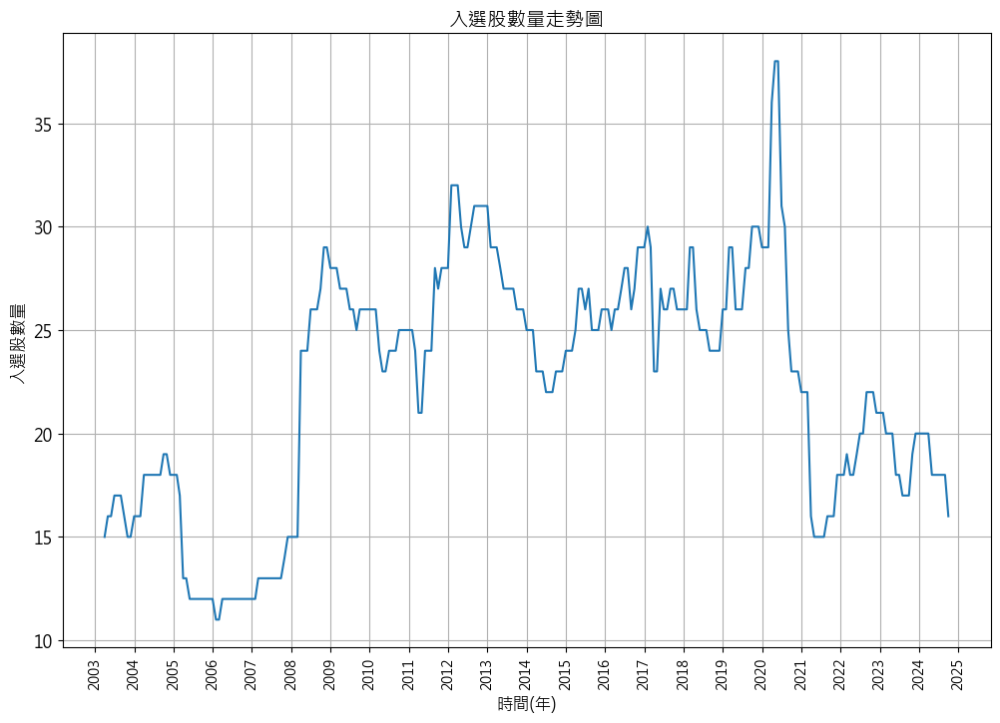

In [48]:
opt_rep_pe.plot_company_counts()

In [49]:
opt_rep_quarter_pe_pos, opt_rep_quarter_pe_neg = opt_rep_pe.calc_returns_contrib(5)

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\report.py:574: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



### 不包含配息率

#### 盈再率 < 80%

In [50]:
# test_noDPR_pe = (test_cond & pe_cond_entry).hold_until((~test_cond) | pe_cond_exit)

In [51]:
# test_pe_rep = backtest.sim(test_noDPR_pe, resample='M', data=data)
# test_pe_rep.get_stats()

In [52]:
# test_pe_rep_pos, test_pe_rep_neg = test_pe_rep.calc_returns_contrib(5)  

### 盈再率 < 40%

In [53]:
opt_noDPR_pe = (nodpr_cond_opt & daily_pe_entry).hold_until((~nodpr_cond_opt) | daily_pe_exit)

In [54]:
rep_opt_noDPR_pe = backtest.sim(opt_noDPR_pe, resample='M', data=data)
rep_opt_noDPR_pe.display()

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,12.75%,22.47,-55.29%,63.98%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
AMRK,2021-10-01,2024-10-01,2021-09-30,2024-09-30,0.010989,753,5473,6226,0.565909,-0.208482,0.664291,0.404134,-0.436294,539.0,0.000000,0.000000
CACC,2010-04-01,2024-10-01,2010-03-31,2024-09-30,0.006849,3649,2577,6226,9.201924,-0.022124,15.214485,0.042850,-0.569270,3641.0,0.000000,0.000000
DIOD,2023-06-01,2024-10-01,2023-05-31,2024-09-30,0.006098,335,5891,6226,-0.321245,-0.356555,0.049589,0.049589,-0.386955,26.0,0.000000,0.000000
EMR,2007-02-01,2024-10-01,2007-01-31,2024-09-30,0.010309,4446,1780,6226,2.958761,-0.419542,3.296041,0.322194,-0.560989,4091.0,0.000000,0.000000
K,2018-05-01,2024-10-01,2018-04-30,2024-09-30,0.007463,1615,4611,6226,0.839346,-0.081862,0.853015,0.294657,-0.301000,1537.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VLO,2023-04-03,NaT,2023-03-31,NaT,0.006098,384,5850,-1,0.061879,-0.247033,0.367959,0.000000,-0.270796,196.0,0.006494,0.006494
VNT,2022-10-03,NaT,2022-09-30,NaT,0.006536,509,5725,-1,0.941613,-0.027074,1.609447,0.038594,-0.294702,501.0,0.006494,0.006494
WAL,2024-05-01,NaT,2024-04-30,NaT,0.006024,113,6121,-1,0.459132,-0.018745,0.520378,0.111780,-0.117401,110.0,0.006494,0.006494


In [55]:
opt_noDPR_pe_pos, opt_noDPR_pe_neg = rep_opt_noDPR_pe.calc_returns_contrib(5)

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\report.py:574: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



---

## 上面的入選股數比較

In [56]:
overall_conds = {}

# overall_conds['所有條件_盈再率<80_無本益比'] = orig_cond
overall_conds['所有條件_盈再率<40_無本益比'] = orig_cond_opt
# overall_conds['所有條件_盈再率<80_每季本益比'] = orig_quarter_pe
overall_conds['所有條件_盈再率<40_有本益比'] = opt_orig_pe
# overall_conds['去掉配息盈再率<80_無本益比'] = test_cond
overall_conds['去掉配息盈再率<40_無本益比'] = nodpr_cond_opt
# overall_conds['去掉配息_盈再率<80_每季本益比'] = test_noDPR_pe
overall_conds['去掉配息_盈再率<40_有本益比'] = opt_noDPR_pe
overall_conds['單一條件_ROE五年平均'] = roe_cond
overall_conds['單一條件_盈再率<40%'] = rr_cond
# overall_conds['單一條件_盈再率<80%'] = (rr<0.8)[START_DATE:END_DATE]


overall_conds_collecs = sim_conditions(overall_conds, resample='M', data=data)
overall_conds_collecs.selected_stock_count_analysis()

Backtesting progress:   0%|          | 0/6 [00:00<?, ?condition/s]c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

Backtesting progress:  17%|█▋        | 1/6 [00:03<00:17,  3.51s/condition]c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:171: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

c:\Users\user\Documents\iplab\stock_factor_lab\2024_code\../../stock_factor_lab\backtest.py:224: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.

Backtesting progress:  33%|███▎      | 2/6 [00:06<00:11,  2.98s/cond

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
單一條件_ROE五年平均,16.46,-53.88,474.56,467.0,391.0,561.0,319.0,690.0
單一條件_盈再率<40%,14.68,-54.18,714.30,707.0,590.0,836.0,408.0,1135.0
去掉配息盈再率<40_無本益比,12.94,-52.79,233.01,218.0,193.0,298.0,109.0,380.0
去掉配息_盈再率<40_有本益比,12.75,-55.29,134.18,148.0,107.5,157.0,63.0,194.0
所有條件_盈再率<40_有本益比,11.13,-53.11,22.36,24.0,18.0,27.0,11.0,38.0
所有條件_盈再率<40_無本益比,11.09,-52.54,41.46,37.0,27.5,58.0,14.0,75.0


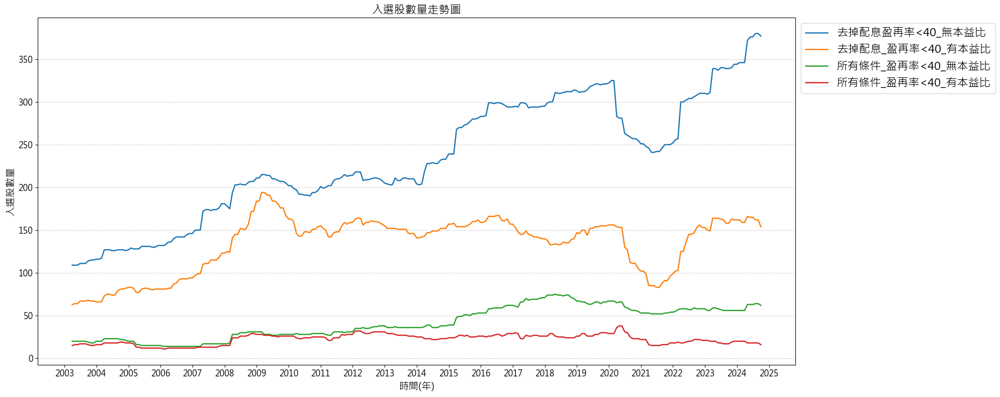

In [57]:
overall_conds_collecs.plot_reps_stock_counts(['去掉配息盈再率<40_無本益比', '去掉配息_盈再率<40_有本益比', '所有條件_盈再率<40_無本益比', '所有條件_盈再率<40_有本益比', ])

In [58]:
overall_conds_collecs.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
單一條件_ROE五年平均,16.46,-53.88,1785.906865,472.00,1126.0,2344.00,7853,28
單一條件_盈再率<40%,14.68,-54.18,1458.886340,366.00,761.0,1827.00,7854,29
去掉配息盈再率<40_無本益比,12.94,-52.79,1385.946849,365.00,733.0,1826.00,7854,28
去掉配息_盈再率<40_有本益比,12.75,-55.29,1125.026709,365.00,699.0,1459.00,7853,29
所有條件_盈再率<40_有本益比,11.13,-53.11,915.401042,334.75,394.0,1044.25,5843,31
所有條件_盈再率<40_無本益比,11.09,-52.54,1090.516779,365.00,701.0,1422.25,7853,31


In [59]:
# overall_conds_collecs.plot_reps_stock_counts(['去掉配息_盈再率<80_每季本益比', '去掉配息_盈再率<40_每季本益比', '所有條件_盈再率<40_無本益比', '所有條件_盈再率<80_無本益比',  '所有條件_盈再率<40_每季本益比'])

---

## 比較有無其中幾項條件的差異 

In [61]:
import itertools

# 定義所有 DataFrame 名稱及其對應的中文名稱
dataframes = {
    'roe_15': roe_cond,  # 假設這些DataFrame已經存在
    'rr_cond': rr_cond,
    'payout_ratio_cond': payout_cond,
    'profit_cond': netprofit_cond,
    # 'hold_cond': hold_cond,
    'listed': listed_cond
}

# 定義 DataFrame 對應的中文名稱
dataframe_names = {
    'roe_15': 'ROE五年平均',
    'rr_cond': '盈再率',
    'payout_ratio_cond': '配息率',
    'profit_cond': '稅前淨利',
    # 'hold_cond': '董監持股',
    'listed': '上市櫃滿兩年'
}


# 用於儲存組合結果
compare_conds_strat = {}

# 產生不同長度的組合，從1到6
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = combined_signal[START_DATE:END_DATE]

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat[key_name] = combined_signal
        counter += 1




compare_strat_collecs = sim_conditions(compare_conds_strat, resample='ME', data=data)

Backtesting progress: 100%|██████████| 31/31 [08:49<00:00, 17.09s/condition]


In [66]:
compare_strat_collecs.selected_stock_count_analysis() # .to_csv('./performance_file/US/20241223_美股_比較是否考慮某項條件其對績效的影響_無本益比進出場.csv', encoding="cp950")

In [ ]:
compare_strat_collecs.selected_stock_count_analysis(ratio=True) # .to_csv('./performance_file/US/20241223_美股_比較是否考慮某項條件其對績效的影響_無本益比進出場_占比.csv', encoding="cp950")

In [63]:
# 用於儲存組合結果
compare_conds_strat_PE={}

# 產生不同長度的組合，從1到6
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = (combined_signal[START_DATE:END_DATE] & daily_pe_entry[START_DATE:END_DATE]).hold_until((~combined_signal[START_DATE:END_DATE]) | daily_pe_exit[START_DATE:END_DATE])

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat_PE[key_name] = combined_signal
        counter += 1


compare_strat_collecs_PE = sim_conditions(compare_conds_strat_PE, resample='ME', data=data)

Backtesting progress: 100%|██████████| 31/31 [05:46<00:00, 11.18s/condition]


In [68]:
compare_strat_collecs_PE.selected_stock_count_analysis() # .to_csv('./performance_file/US/20241223_美股_比較是否考慮某項條件其對績效的影響_本益比進出場.csv', encoding="cp950")

In [69]:
compare_strat_collecs_PE.selected_stock_count_analysis(ratio=True) # .to_csv('./performance_file/US/20241223_美股_比較是否考慮某項條件其對績效的影響_本益比進出場_占比.csv', encoding="cp950")

<Axes: xlabel='date'>

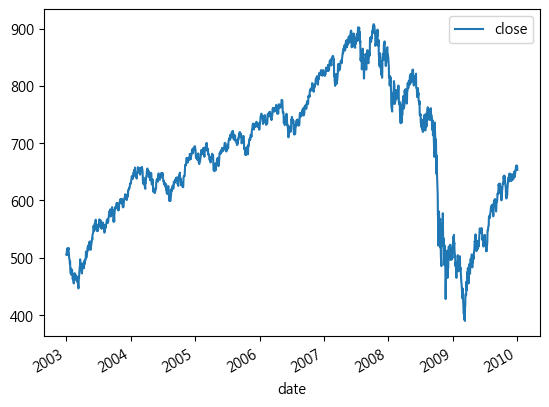

In [64]:
# df = data.get('ruaindex:close')
# df['2003':'2009-12'].plot()

In [65]:
# compare_conds_strat={}
# compare_conds_strat_PE_Q={}



# ## 比較有無某項條件績效差異 (都有本益比進出場)
# sig_1 = rr_cond & payout_cond
# sig_2 = rr_cond & payout_cond & listed_cond
# sig_3 = rr_cond & payout_cond & netprofit_cond & listed_cond
# sig_4 = rr_cond & payout_cond & netprofit_cond
# sig_5 = roe_cond & rr_cond & netprofit_cond & listed_cond
# sig_6 = rr_cond & netprofit_cond
# sig_7 = roe_cond & rr_cond & netprofit_cond
# sig_8 = rr_cond & roe_cond
# sig_9 = roe_cond & rr_cond & payout_cond
# sig_10 = roe_cond & rr_cond & payout_cond & listed_cond

In [66]:
# # 策略dict (沒有本益比進出場)
# compare_conds_strat['盈再率+配息率'] = sig_1 
# compare_conds_strat['盈再率+配息率+上市櫃兩年'] = sig_2
# compare_conds_strat['盈再率+配息率+淨利+上市櫃兩年'] = sig_3
# compare_conds_strat['盈再率+配息率+淨利'] = sig_4
# compare_conds_strat['ROE+盈再率+淨利+上市櫃兩年'] = sig_5
# compare_conds_strat['盈再率+淨利'] = sig_6
# compare_conds_strat['ROE+盈再率+淨利'] = sig_7
# compare_conds_strat['ROE+盈再率'] = sig_8
# compare_conds_strat['ROE+盈再率+配息率'] = sig_9
# compare_conds_strat['ROE+盈再率+配息率+上市櫃兩年'] = sig_10


# compare_strats_collecs = sim_conditions(compare_conds_strat, resample='M', data=data)
# compare_strats_collecs.selected_stock_count_analysis()

In [67]:
# # 策略dict (有本益比進出場)
# compare_conds_strat_PE_Q['盈再率+配息率'] = (sig_1 & pe_cond_entry).hold_until(~sig_1 | pe_cond_exit)
# compare_conds_strat_PE_Q['盈再率+配息率+上市櫃兩年'] = (sig_2 & pe_cond_entry).hold_until(~sig_2 | pe_cond_exit)
# compare_conds_strat_PE_Q['盈再率+配息率+淨利+上市櫃兩年'] = (sig_3 & pe_cond_entry).hold_until(~sig_3 | pe_cond_exit)
# compare_conds_strat_PE_Q['盈再率+配息率+淨利'] = (sig_4 & pe_cond_entry).hold_until(~sig_4 | pe_cond_exit)
# compare_conds_strat_PE_Q['ROE+盈再率+淨利+上市櫃兩年'] = (sig_5 & pe_cond_entry).hold_until(~sig_5 | pe_cond_exit)
# compare_conds_strat_PE_Q['盈再率+淨利'] = (sig_6 & pe_cond_entry).hold_until(~sig_6 | pe_cond_exit)
# compare_conds_strat_PE_Q['ROE+盈再率+淨利'] = (sig_7 & pe_cond_entry).hold_until(~sig_7 | pe_cond_exit)
# compare_conds_strat_PE_Q['ROE+盈再率'] = (sig_8 & pe_cond_entry).hold_until(~sig_8 | pe_cond_exit)
# compare_conds_strat_PE_Q['ROE+盈再率+配息率'] = (sig_9 & pe_cond_entry).hold_until(~sig_9 | pe_cond_exit)
# compare_conds_strat_PE_Q['ROE+盈再率+配息率+上市櫃兩年'] = (sig_10 & pe_cond_entry).hold_until(~sig_10 | pe_cond_exit)



# compare_PE_strat_collecs = sim_conditions(compare_conds_strat_PE_Q, resample='M', data=data)
# compare_PE_strat_collecs.selected_stock_count_analysis()

---

## 本益比頻率 - 每季

### 月初、月中、月底

80

In [68]:
# rep_all_cond_and_pe_MS = backtest.sim(orig_quarter_pe, resample='MS', data=data)
# rep_all_cond_and_pe_MS.get_stats()

40

In [69]:
# rep_opt_cond_and_pe_MS = backtest.sim(opt_orig_pe, resample='MS', data=data)
# rep_opt_cond_and_pe_MS.get_stats()

80

In [70]:
# rep_all_cond_and_pe_M15 = backtest.sim(orig_quarter_pe, resample='M', resample_offset='15D', data=data)
# rep_all_cond_and_pe_M15.get_stats()

40

In [71]:
# rep_opt_cond_and_pe_M15 = backtest.sim(opt_orig_pe, resample='M', resample_offset='15D', data=data)
# rep_opt_cond_and_pe_M15.get_stats()

80

In [72]:
# rep_all_cond_and_pe_M = backtest.sim(orig_quarter_pe, resample='M', data=data)
# rep_all_cond_and_pe_M.get_stats()

40

In [73]:
# rep_opt_cond_and_pe_M = backtest.sim(opt_orig_pe, resample='M', data=data)
# rep_opt_cond_and_pe_M.get_stats()

### 每季

In [74]:
# rep_all_cond_and_pe_Q_orig = backtest.sim(opt_orig_pe, resample='Q',data=data)
# rep_all_cond_and_pe_Q_orig.get_stats()

### 每年

In [75]:
# rep_all_cond_and_pe_A = backtest.sim(opt_orig_pe, resample='A', data=data)
# rep_all_cond_and_pe_A.get_stats()

In [76]:
# rep_all_cond_and_pe_A15 = backtest.sim(opt_orig_pe, resample='A', resample_offset="15D",data=data)
# rep_all_cond_and_pe_A15.get_stats()

In [77]:
# rep_all_cond_and_pe_A30 = backtest.sim(opt_orig_pe, resample='A', resample_offset="30D",data=data)
# rep_all_cond_and_pe_A30.get_stats()

In [78]:
# rep_all_cond_and_pe_A45 = backtest.sim(opt_orig_pe, resample='A', resample_offset="45D",data=data)
# rep_all_cond_and_pe_A45.get_stats()

---

## 本益比頻率 - 每日

In [79]:
# daily_pe_entry = pe_daily < 12
# daily_pe_exit = pe_daily > 30

In [80]:
daily_pe_resample = pe_daily.resample('M').last()[START_DATE:END_DATE]

daily_pe_entry_M = (daily_pe_resample < 12)
daily_pe_exit_M = (daily_pe_resample > 30)

### 月初月中月底

In [81]:
daily_pe_entry_MS = daily_pe_entry.resample('MS').first()
daily_pe_exit_MS = daily_pe_exit.resample('MS').first()

80

In [82]:
PE_daily_MS_cond = ((orig_cond & daily_pe_entry_MS).hold_until((~orig_cond) | daily_pe_exit_MS))
rep_PE_daily_MS_cond = backtest.sim(PE_daily_MS_cond, resample='MS', data=data)
rep_PE_daily_MS_cond.get_stats()

{'CAGR': -0.007857090830144742,
 'daily_sharpe': 117.54,
 'max_drawdown': -0.5319542861496906,
 'avg_drawdown': -0.06498050051220353,
 'win_ratio': 0.6410256410256411,
 'ytd': -0.1334394401392035}

40

In [83]:
PE_daily_MS_opt = ((orig_cond_opt & daily_pe_entry_MS).hold_until((~orig_cond_opt) | daily_pe_exit_MS))
rep_PE_daily_MS_opt = backtest.sim(PE_daily_MS_cond, resample='MS', data=data)
rep_PE_daily_MS_opt.get_stats()

{'CAGR': -0.007857090830144742,
 'daily_sharpe': 117.54,
 'max_drawdown': -0.5319542861496906,
 'avg_drawdown': -0.06498050051220353,
 'win_ratio': 0.6410256410256411,
 'ytd': -0.1334394401392035}

80

In [84]:
# PE_daily_M_cond = ((orig_cond & daily_pe_entry_M).hold_until((~orig_cond) | daily_pe_exit_M))

In [85]:
# rep_PE_daily_M15_cond = backtest.sim(PE_daily_M_cond, resample='M', resample_offset='15D', data=data)
# rep_PE_daily_M15_cond.get_stats()

40

In [86]:
# PE_daily_M_opt = ((orig_cond_opt & daily_pe_entry_M).hold_until((~orig_cond_opt) | daily_pe_exit_M))

# rep_PE_daily_M15_opt = backtest.sim(PE_daily_M_opt, resample='M', resample_offset='15D', data=data)
# rep_PE_daily_M15_opt.display()

In [87]:
# rep_PE_daily_M_cond = backtest.sim(PE_daily_M_opt, resample='M', data=data)
# rep_PE_daily_M_cond.display()

### 每季

In [88]:
# daily_pe_entry_Q = daily_pe_entry.resample('Q').last()
# daily_pe_exit_Q = daily_pe_exit.resample('Q').last()


# PE_daily_Q_cond = ((orig_cond_opt & daily_pe_entry_Q).hold_until((~orig_cond_opt) | daily_pe_exit_Q))
# rep_PE_daily_Q_cond = backtest.sim(PE_daily_Q_cond, resample='Q', data=data)
# rep_PE_daily_Q_cond.get_stats()

### 每年

In [89]:
# daily_pe_entry_A = daily_pe_entry.resample('A').last()
# daily_pe_exit_A = daily_pe_exit.resample('A').last()


# PE_daily_A_cond = ((orig_cond_opt & daily_pe_entry_A).hold_until((~orig_cond_opt) | daily_pe_exit_A))
# rep_PE_daily_A_cond = backtest.sim(PE_daily_A_cond, resample='A', data=data)
# rep_PE_daily_A_cond.get_stats()

In [90]:
# rep_PE_daily_A15_cond = backtest.sim(PE_daily_A_cond, resample='A', resample_offset='15D',data=data)
# rep_PE_daily_A15_cond.get_stats()

In [91]:
# rep_PE_daily_A30_cond = backtest.sim(PE_daily_A_cond, resample='A', resample_offset='30D',data=data)
# rep_PE_daily_A30_cond.get_stats()

In [92]:
# rep_PE_daily_A45_cond = backtest.sim(PE_daily_A_cond, resample='A', resample_offset='45D',data=data)
# rep_PE_daily_A45_cond.get_stats()

### 每週、每兩週

In [93]:
# daily_pe_entry_W = daily_pe_entry.resample('W').last()
# daily_pe_exit_W = daily_pe_exit.resample('W').last()


# PE_daily_W_cond = ((orig_cond_opt & daily_pe_entry_W).hold_until((~orig_cond_opt) | daily_pe_exit_W))
# rep_PE_daily_W = backtest.sim(PE_daily_W_cond, resample='W', data=data)
# rep_PE_daily_W.get_stats()

In [94]:
# daily_pe_entry_2W = daily_pe_entry.resample('2W').last()
# daily_pe_exit_2W = daily_pe_exit.resample('2W').last()

# PE_daily_2W_cond = ((orig_cond_opt & daily_pe_entry_2W).hold_until((~orig_cond_opt) | daily_pe_exit_2W))
# rep_PE_daily_2W = backtest.sim(PE_daily_2W_cond, resample='2W', data=data)
# rep_PE_daily_2W.get_stats()

### 每日

In [95]:
# PE_daily_D_cond = ((orig_cond_opt & daily_pe_entry).hold_until((~orig_cond_opt) | daily_pe_exit))
# rep_PE_daily_D = backtest.sim(PE_daily_D_cond, resample='D', data=data)
# rep_PE_daily_D.display()

---

---

## 改看稅前淨利

In [96]:
# income_bf_tax

In [97]:
# rr_cond & roe_cond & netprofit_cond & payout_cond & listed_cond

# orig_cond_opt_mod = rr_cond & roe_cond & income_bf_tax_cond & payout_cond & listed_cond

In [98]:
# rep_orig_opt_mod = backtest.sim(orig_cond_opt_mod, resample='M', data=data)
# rep_orig_opt_mod.display()

### 含每季本益比進出場

In [99]:
# orig_opt_mod_pe = (orig_cond_opt_mod & pe_cond_entry).hold_until((~orig_cond_opt_mod) | pe_cond_exit)

In [100]:
# rep_orig_opt_mod_pe = backtest.sim(orig_opt_mod_pe, resample='M', data=data)
# rep_orig_opt_mod_pe.display()

---

## 大盤比較

In [101]:
# rua_benchmark = data.get('ruaindex:close')

In [102]:
# # ax = rua_benchmark.plot(figsize=(24, 6))
# # ax.grid(True)

# # 找出每年的第一天作為 xticks
# year_starts = rua_benchmark.index.to_series().groupby(rua_benchmark.index.year).first()

# # 畫圖
# ax = rua_benchmark.plot(figsize=(24, 6))
# ax.grid(True)

# # 設定 X 軸刻度和標籤
# ax.set_xticks(year_starts.values)  # 使用每年第一天的日期
# ax.set_xticklabels(year_starts.index.astype(str), rotation=90)  # 將年份轉為字串

# plt.show()

In [103]:
# data_tw = Data()

In [104]:
# taiex_benchmark = data_tw.get('taiex:close')

In [105]:
# # Filter the dataframes for the given date range
# taiex_filtered = taiex_benchmark[START_DATE:END_DATE]
# rua_filtered = rua_benchmark[START_DATE:END_DATE]

# # Normalize the data to align the starting points
# taiex_normalized = taiex_filtered['close'] / taiex_filtered.iloc[0]['close']
# rua_normalized = rua_filtered['close'] / rua_filtered.iloc[0]['close']

# # Create a figure and a set of subplots
# fig, ax1 = plt.subplots(figsize=(18, 7))

# # Plot TAIEX on the left y-axis
# ax1.plot(taiex_filtered.index, taiex_normalized, label='台灣加權指數', color='tab:blue')
# ax1.set_xlabel('Date')
# ax1.set_ylabel('TAIEX', color='tab:blue')
# ax1.tick_params(axis='y', labelcolor='tab:blue')

# # Create a second y-axis sharing the same x-axis
# ax2 = ax1.twinx()
# ax2.plot(rua_filtered.index, rua_normalized, label='Russell 3000', color='tab:orange')
# ax2.set_ylabel('Russell 3000', color='tab:red', rotation=270, labelpad=15)
# ax2.tick_params(axis='y', labelcolor='tab:orange')

# # Ensure both y-axes have the same range
# ax1.set_ylim(0.75, max(taiex_normalized.max()+0.1, rua_normalized.max()+0.1))
# ax2.set_ylim(0.75, max(taiex_normalized.max()+0.1, rua_normalized.max()+0.1))

# # Add a red horizontal line at y=1
# ax1.axhline(y=1, color='red', linestyle='-', linewidth=0.3, alpha=0.7)

# # 特別標記'2009-03-31'這一天的垂直線，使用紅色虛線
# ax1.axvline(pd.Timestamp('2009-03-31'), color='red', linestyle='--', linewidth=2.1)

# # Add title and grid
# plt.title('大盤指數（切2009/3/31）')
# ax1.grid(linestyle='--', linewidth=0.5, alpha=0.8)

# # Combine legends from both axes
# lines_1, labels_1 = ax1.get_legend_handles_labels()
# lines_2, labels_2 = ax2.get_legend_handles_labels()
# ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left', fontsize='14')

# # Show the plot
# fig.tight_layout()
# plt.show()